<a href="https://colab.research.google.com/github/mori-assereto/DataAlchemy/blob/main/Modeling_SIR_D_for_Covid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Objective of the work
The spread of epidemiological diseases has been a topic of great interest and relevance in the scientific community and society at large. Understanding how a disease spreads in a population and how different factors can influence its diffusion is essential for making informed and effective decisions in the management of epidemics. In this context, data science has emerged as a powerful tool for modelling and analysing disease spread using graph-based approaches.

This report discusses a project exploring the spread of disease using graphs and applying the SIR-D (Susceptible-Infected-Recovered with subdivision into Infected-Incubating) model. The main objective of this project is to hypothesise the spread of diseases, specifically COVID-19, in a population modelled by a graph network in a simple way.

The central objective of this project is to develop a graph-based model to simulate the spread of epidemic diseases, in particular COVID-19, using the SIR-D model. To achieve this purpose, we propose the creation of a class called "Model SIR-D", which will be designed to receive a variety of parameters representing different characteristics of the population and the disease. These parameters include the presence of supercontagion, control measures implemented, existence of previous pathologies and the age of the individuals, among others.

# Preparation of the programming environment

## Installation of libraries

In [ ]:
!pip install networkx
!pip install matplotlib
!pip install numpy


## Library import

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np


# SIR-D model with Erdős-Rényi

The code has the following steps:

1. Creates an Erdős-Rényi graph, which is a type of random graph used to model social networks.
2. Initialise the state of the nodes in the graph. Nodes can be in one of three states: susceptible, infected or recovered.
3. Simulate the spread of the disease. On each day, infected nodes infect susceptible nodes with a probability that depends on several factors, such as the rate of transmission, the age of the nodes, and the presence of pre-existing conditions.
4. Visualise the spread of the disease (optional).


In [ ]:
import networkx as nx

class ModelSIRD:
    """
    Simulates the SIR-D model.

    Args:
        num_nodes (int): The number of nodes in the network.
        avg_connections: Average number of connections per node in Erdos-Rényi.
        transmission_rate (float): The transmission rate of the virus.
        incubation_period (int): The incubation period of the virus.
        infection_duration (int): The duration of infection.
        supercontagion_prob (float): Probability that a node is a supercontagion.

    Returns:
        graph (networkx.Graph): The graph of the simulation.
    """
    def __init__(self, num_nodes, avg_connections, transmission_rate, incubation_period, infection_duration, supercontagion_prob):
        self.num_nodes = num_nodes
        self.avg_connections = avg_connections
        self.transmission_rate = transmission_rate
        self.incubation_period = incubation_period
        self.infection_duration = infection_duration
        self.supercontagion_prob = supercontagion_prob

    def simulate(self, max_time):
        # Erdos Renyi type network
        graph = nx.erdos_renyi_graph(self.num_nodes, self.avg_connections / self.num_nodes)

        # Initialise node state
        for node in graph.nodes():
            graph.nodes[node]['status'] = 'susceptible'
            graph.nodes[node]['age'] = np.random.randint(20, 80)
            graph.nodes[node]['preexisting_condition'] = np.random.choice([True, False], p=[0.2, 0.8])
            graph.nodes[node]['control_measure'] = np.random.choice([True, False], p=[0.2, 0.8])
            graph.nodes[node]['supercontagion'] = np.random.choice([True, False], p=[self.supercontagion_prob, 1 - self.supercontagion_prob]),  # Likelihood of being a supercontagionist
            graph.nodes[node]['supercontagion_rate'] = self.transmission_rate * 3 # Transmission rate of supercontactor node

        # Initialise propagation
        for node in graph.nodes():
            if np.random.rand() < 0.01:
                graph.nodes[node]['status'] = 'infected'

        # Simulation of the propagation
        for day in range(max_time):
            # Update node status
            for node in graph.nodes():
                if graph.nodes[node]['status'] == 'infected':
                    graph.nodes[node]['status'] == 'incubating'
                    if day >= self.incubation_period:
                        graph.nodes[node]['status'] = 'infected'
                elif graph.nodes[node]['status'] == 'incubating':
                    graph.nodes[node]['status'] = 'infected'


            # Infecting susceptible nodes
            new_infected = []
            for node in graph.nodes():
                if graph.nodes[node]['status'] == 'infected':
                    for neighbor in graph.neighbors(node):
                        if graph.nodes[neighbor]['status'] == 'susceptible':
                            # Transmission model: probability of transmission according to characteristics
                            transmission_prob = self.transmission_rate
                            if graph.nodes[node]['age'] > 60:
                                transmission_prob *= 1.5
                            if graph.nodes[node]['preexisting_condition']:
                                transmission_prob *= 1.3
                            if graph.nodes[node]['control_measure']:
                                transmission_prob *= 0.5
                            if graph.nodes[node]['supercontagion']:
                                if graph.nodes[node]['status'] == 'infected' and graph.nodes[node]['supercontagion']:
                                    transmission_prob = graph.nodes[node]['supercontagion_rate']


                            if np.random.rand() < transmission_prob:
                                new_infected.append(neighbor)

            # Update status of infected nodes
            for node in new_infected:
                graph.nodes[node]['status'] = 'infected'

            # Display propagation (optional)
            if day % 5 == 0:
                infected_nodes = [node for node in graph.nodes() if graph.nodes[node]['status'] == 'infected']
                pos = nx.spring_layout(graph)
                nx.draw(graph, pos, nodelist=infected_nodes, node_size=30, node_color='red', alpha=0.5)
                plt.title(f"Propagación de la enfermedad - Día {day}")
                plt.show()


        return graph



### Verification

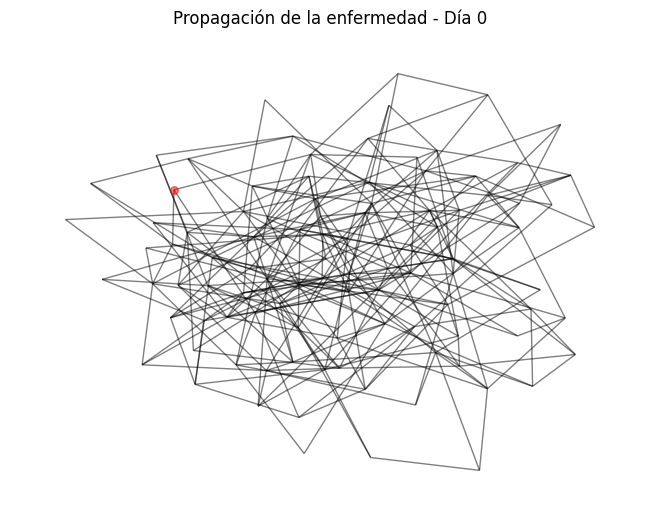

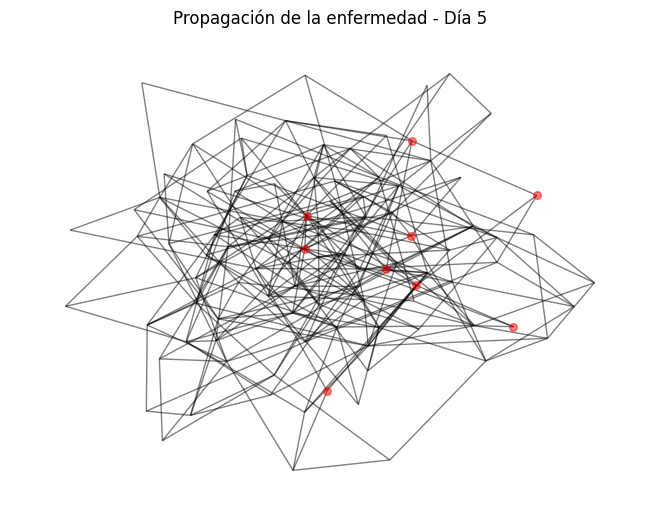

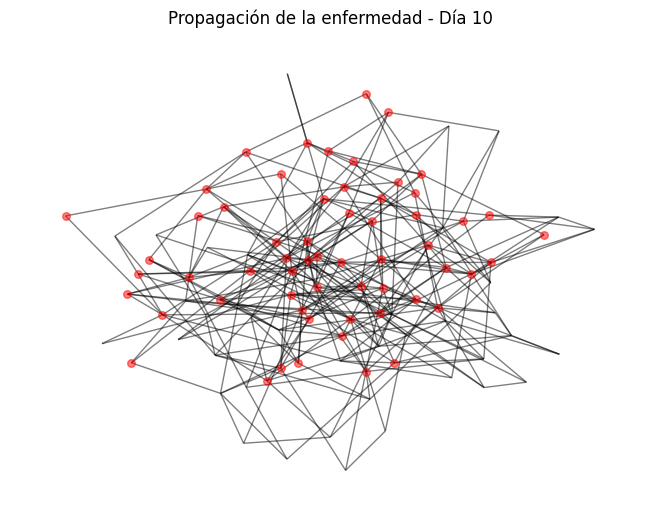

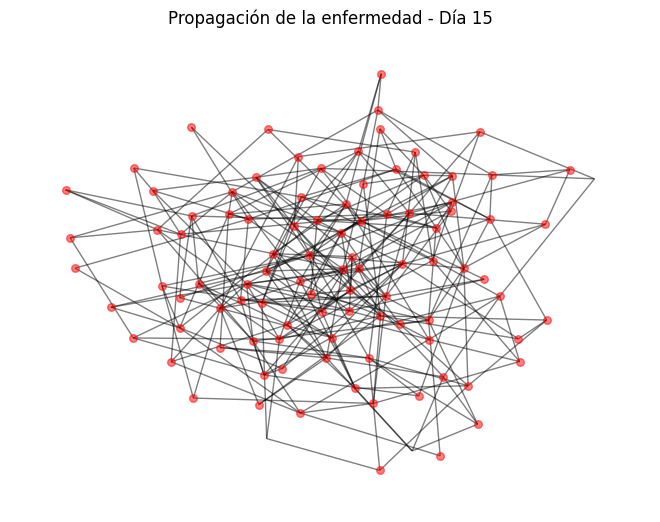

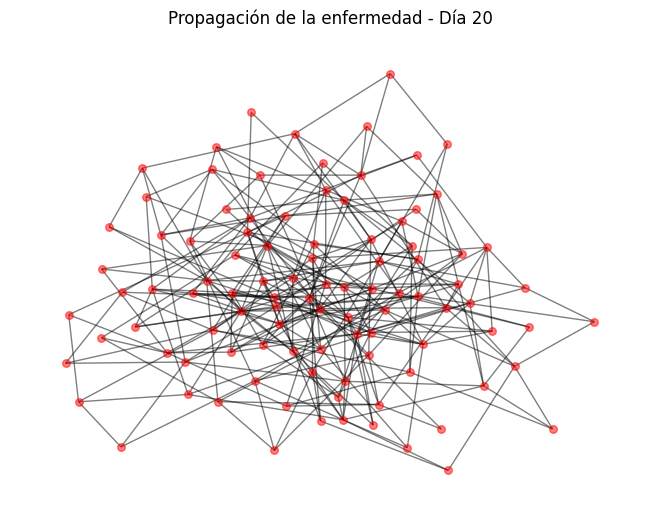

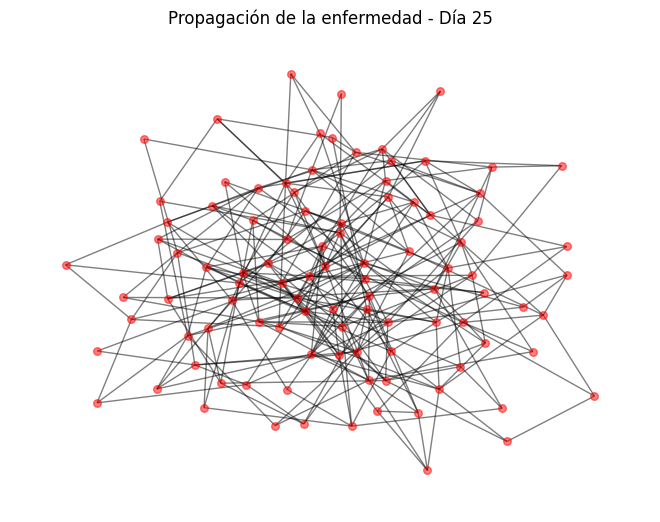

In [ ]:
import networkx as nx

# Creates a model of the spread of disease
model = ModelSIRD(num_nodes=100, avg_connections=6, transmission_rate=0.05, incubation_period=5, infection_duration=10, supercontagion_prob=0.3)

# Perform a simulation
graph = model.simulate(max_time=30)


## Simulation
We can simulate the model by varying the following parameters:

* Transmission rate: The transmission rate is the most important parameter in the model. It can significantly influence the spread of the disease.
* Incubation period: Incubation period is the time between infection and the onset of symptoms. It can influence the number of people who are susceptible to infection.
* Duration of infection: Duration of infection is the time between the onset of symptoms and recovery or death. It can influence the number of people who are infectious.
In addition, we can simulate the model by varying the following factors:

* Age: Older people have a higher risk of developing severe complications of COVID-19.
* Pre-existing conditions: People with pre-existing conditions, such as diabetes or heart disease, also have a higher risk of developing severe COVID-19 complications.
* Control measures: Control measures, such as wearing masks and social distancing, can help reduce the spread of the disease.
We can use simulations to compare the effects of these parameters and factors on the spread of disease. This can help us to better understand how SIR-D models work and to develop strategies to control the spread of COVID-19.

### Transmission Rate
The transmission rate has a significant impact on the spread of the disease. With a low transmission rate, the disease spreads slowly and only affects a small number of people. With a high transmission rate, the disease spreads rapidly and can affect the entire population.

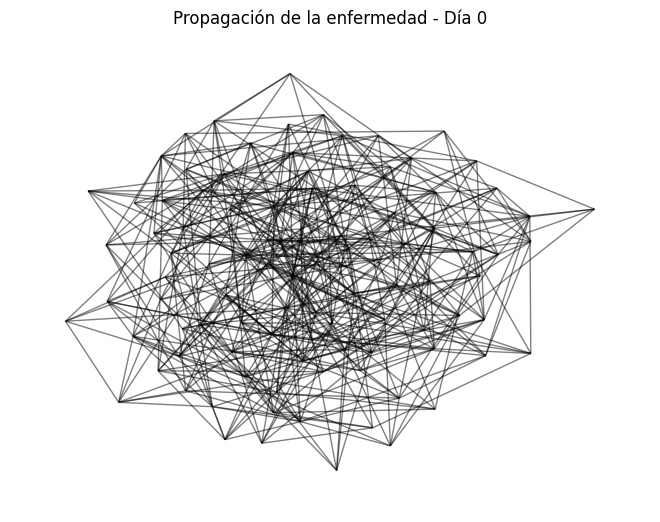

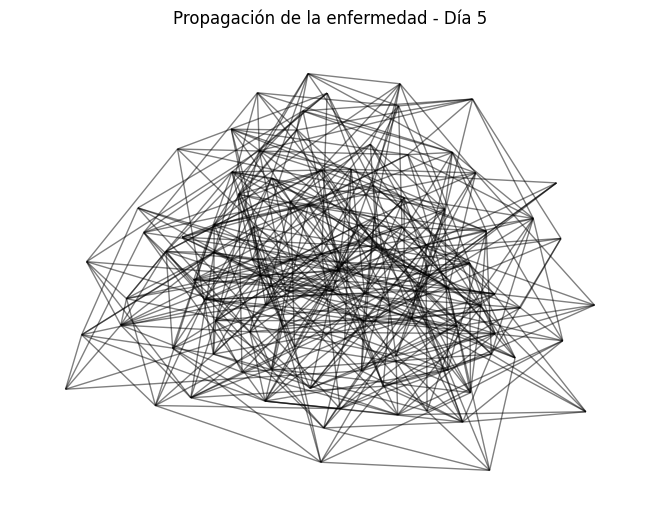

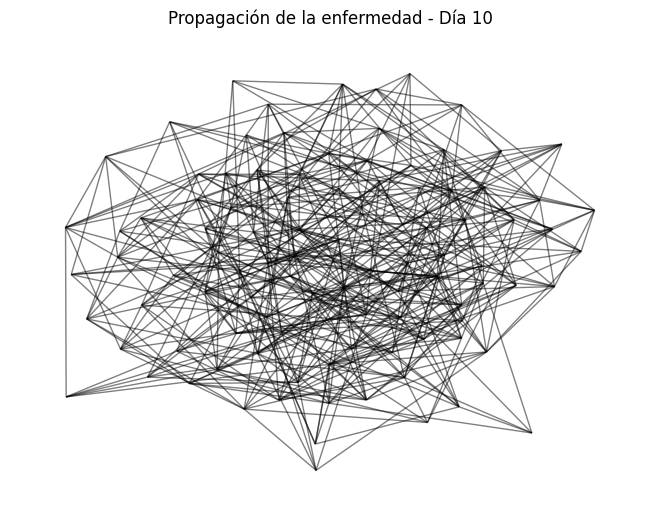

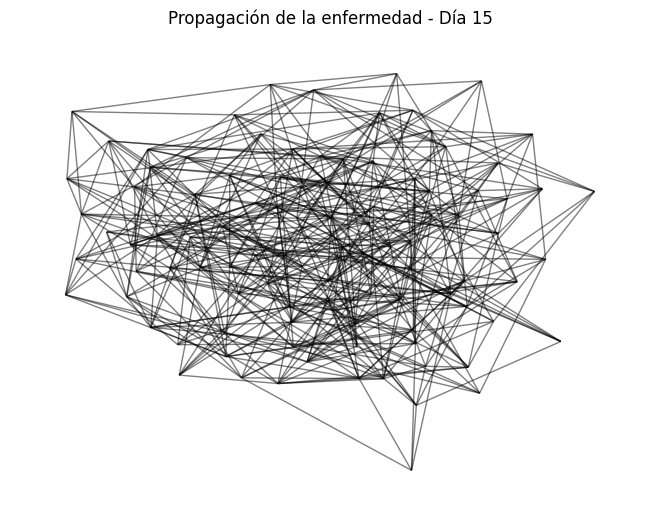

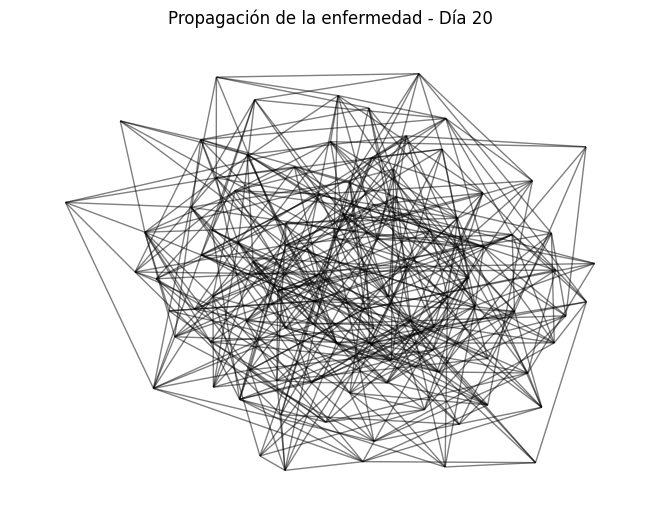

...

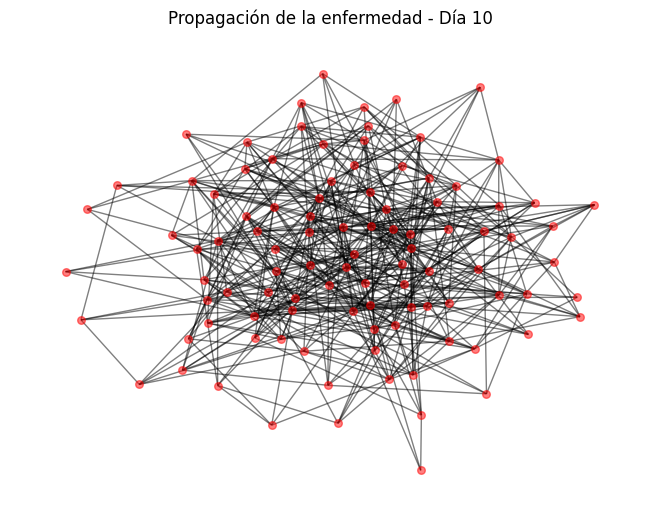

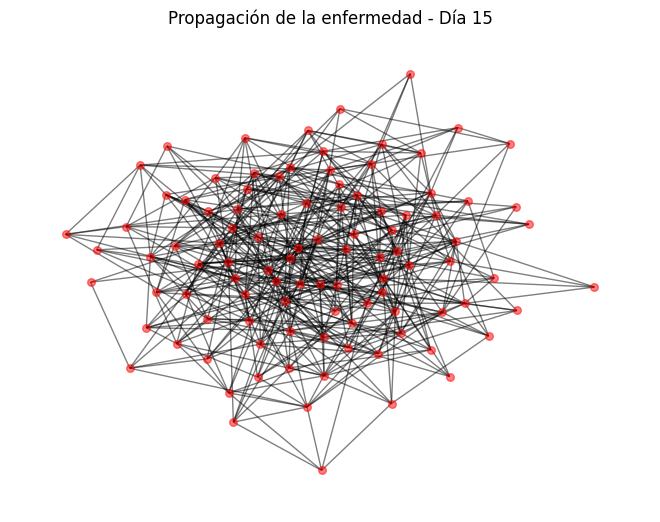

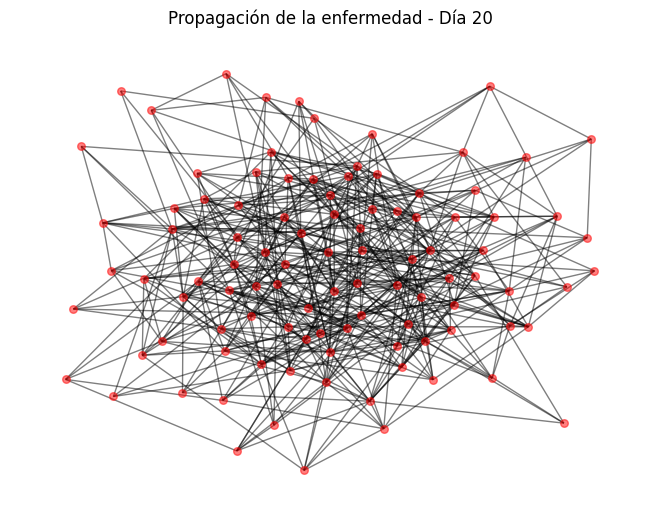

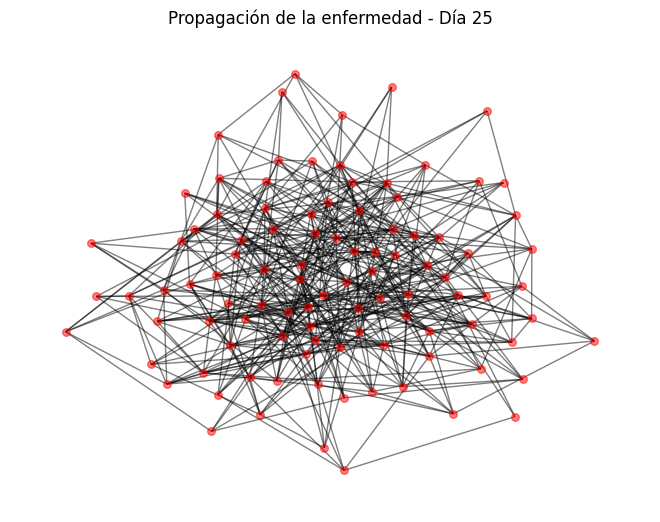

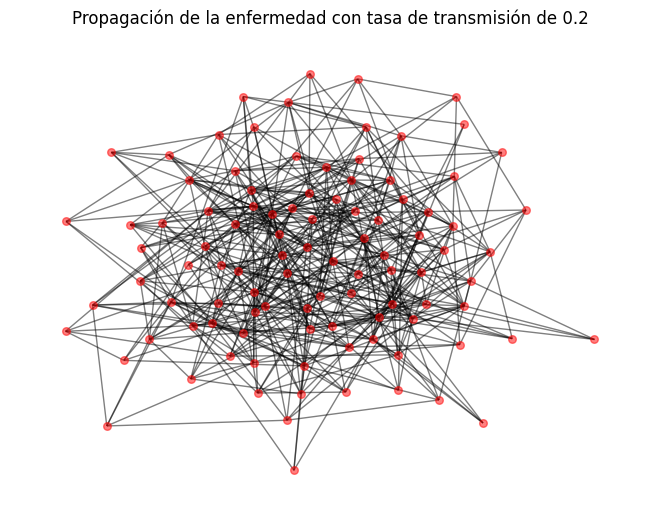

In [ ]:
import networkx as nx

# Create a SIRD model
model = ModelSIRD(num_nodes=100, avg_connections=10, transmission_rate=0.05, incubation_period=5, infection_duration=10, supercontagion_prob=0.3)

# Simulates the spread of the disease at different rates of transmission
for transmission_rate in [0.01, 0.05, 0.1, 0.2]:
    # Performs the simulation
    graph = model.simulate(max_time=30)

    # Charting the spread of disease
    infected_nodes = [node for node in graph.nodes() if graph.nodes[node]['status'] == 'infected']
    pos = nx.spring_layout(graph)
    nx.draw(graph, pos, nodelist=infected_nodes, node_size=30, node_color='red', alpha=0.5)
    plt.title(f"Propagación de la enfermedad con tasa de transmisión de {transmission_rate}")
    plt.show()


### Supercontagion Prob
 The supercontagion probability is the probability that an infected node is a supercontagion. Supercontagioners can infect more people than normal infected nodes.
 The supercontagion probability has a significant impact on the spread of the disease. With a high supercontagion probability, supercontagionists can cause the disease to spread rapidly and affect a large number of people. With a low supercontagion probability, supercontagionists have less impact on the spread of the disease.

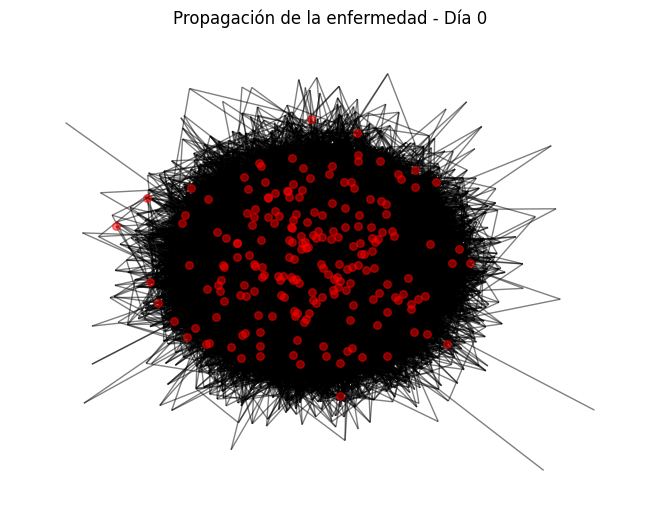

KeyboardInterrupt: ignored

In [ ]:
import networkx as nx

# Create a SIRD model
model = ModelSIRD(num_nodes=10000, avg_connections=10, transmission_rate=0.05, incubation_period=5, infection_duration=10, supercontagion_prob=0.3)

# Simulates the spread of the disease with different probabilities of supercontagion
for supercontagion_prob in [0.1, 0.2, 0.3, 0.4]:
    # Performs the simulation
    graph = model.simulate(max_time=30)

    # Charting the spread of disease
    infected_nodes = [node for node in graph.nodes() if graph.nodes[node]['status'] == 'infected']
    pos = nx.spring_layout(graph)
    nx.draw(graph, pos, nodelist=infected_nodes, node_size=30, node_color='red', alpha=0.5)
    plt.title(f"Propagación de la enfermedad con probabilidad de supercontagión de {supercontagion_prob}")
    plt.show()


# SIR-D model with Barabasi-Albert

For COVID-19, I would recommend using a Barabasi-Albert network. This network is a good representation of the structure of human social networks, as it has a central core of connected nodes and a periphery of nodes with few contacts.

This is important because COVID-19 propagates mainly through social networks. The central nodes of the network are the ones that have the most contact with other people, so they are more likely to become infected and spread the disease.

By using a Barabasi-Albert network, we can better model the spread of COVID-19 and assess the impact of mitigation measures. For example, we can use the model to estimate how many cases could be prevented if measures such as social distancing or quarantine are implemented.

Of course, it is important to keep in mind that COVID-19 is a complex disease and that there are many factors that influence its spread. The use of a mathematical model is just one tool that can help us better understand the disease and make better decisions about how to deal with it.

Compared to what we did, I think the use of a Barabasi-Albert network could help us better understand the spread of COVID-19 in the population. This could lead to the implementation of more effective mitigation measures to help prevent the spread of the disease.

In [ ]:
import networkx as nx

class ModelSIRD:
    """
    Simulates the SIR-D model.

    Args:
        num_nodes (int): The number of nodes in the network.
        avg_connections: Average number of connections per node in Erdos-Rényi.
        transmission_rate (float): The transmission rate of the virus.
        incubation_period (int): The incubation period of the virus.
        infection_duration (int): The duration of infection.
        supercontagion_prob (float): Probability that a node is a supercontagion.

    Returns:
        graph (networkx.Graph): The graph of the simulation.
    """
    def __init__(self, num_nodes, avg_connections, transmission_rate, incubation_period, infection_duration, supercontagion_prob):
        self.num_nodes = num_nodes
        self.avg_connections = avg_connections
        self.transmission_rate = transmission_rate
        self.incubation_period = incubation_period
        self.infection_duration = infection_duration
        self.supercontagion_prob = supercontagion_prob

    def simulate(self, max_time):
        # Barbasi-Albert type network
        graph = nx.barabasi_albert_graph(self.num_nodes, self.avg_connections)

        # Initialise node state
        for node in graph.nodes():
            graph.nodes[node]['status'] = 'susceptible'
            graph.nodes[node]['age'] = np.random.randint(2, 100)
            graph.nodes[node]['preexisting_condition'] = np.random.choice([True, False], p=[0.2, 0.8])
            graph.nodes[node]['control_measure'] = np.random.choice([True, False], p=[0.2, 0.8])
            graph.nodes[node]['supercontagion'] = np.random.choice([True, False], p=[self.supercontagion_prob, 1 - self.supercontagion_prob]),  # Likelihood of being a supercontagionist
            graph.nodes[node]['supercontagion_rate'] = self.transmission_rate * 3 # Transmission rate of supercontactor node

        # Initialise propagation
        for node in graph.nodes():
            if np.random.rand() < 0.01:
                graph.nodes[node]['status'] = 'infected'

        # Simulation of propagation
        for day in range(max_time):
            # Update node status
            for node in graph.nodes():
                if graph.nodes[node]['status'] == 'infected':
                    graph.nodes[node]['status'] == 'incubating'
                    if day >= self.incubation_period:
                        graph.nodes[node]['status'] = 'infected'
                elif graph.nodes[node]['status'] == 'incubating':
                    graph.nodes[node]['status'] = 'infected'


            # Infecting susceptible nodes
            new_infected = []
            for node in graph.nodes():
                if graph.nodes[node]['status'] == 'infected':
                    for neighbor in graph.neighbors(node):
                        if graph.nodes[neighbor]['status'] == 'susceptible':
                            # Transmission model: probability of transmission according to characteristics
                            transmission_prob = self.transmission_rate
                            if graph.nodes[node]['age'] > 65:
                                transmission_prob *= 1.5
                            if graph.nodes[node]['preexisting_condition']:
                                transmission_prob *= 1.3
                            if graph.nodes[node]['control_measure']:
                                transmission_prob *= 0.5
                            if graph.nodes[node]['supercontagion']:
                                if graph.nodes[node]['status'] == 'infected' and graph.nodes[node]['supercontagion']:
                                    transmission_prob = graph.nodes[node]['supercontagion_rate']


                            if np.random.rand() < transmission_prob:
                                new_infected.append(neighbor)

            # Updating the status of infected nodes
            for node in new_infected:
                graph.nodes[node]['status'] = 'infected'

            # Display of propagation (optional)
            if day % 5 == 0:
                infected_nodes = [node for node in graph.nodes() if graph.nodes[node]['status'] == 'infected']
                pos = nx.spring_layout(graph)
                nx.draw(graph, pos, nodelist=infected_nodes, node_size=30, node_color='red', alpha=0.5)
                plt.title(f"Propagación de la enfermedad - Día {day}")
                plt.show()


        return graph



### Verification

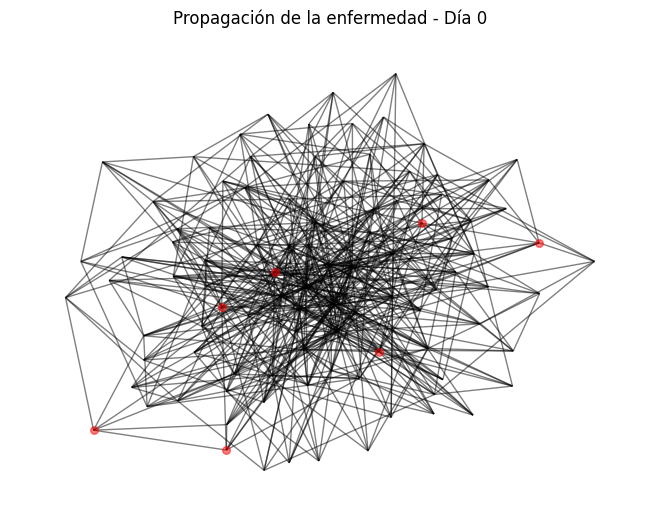

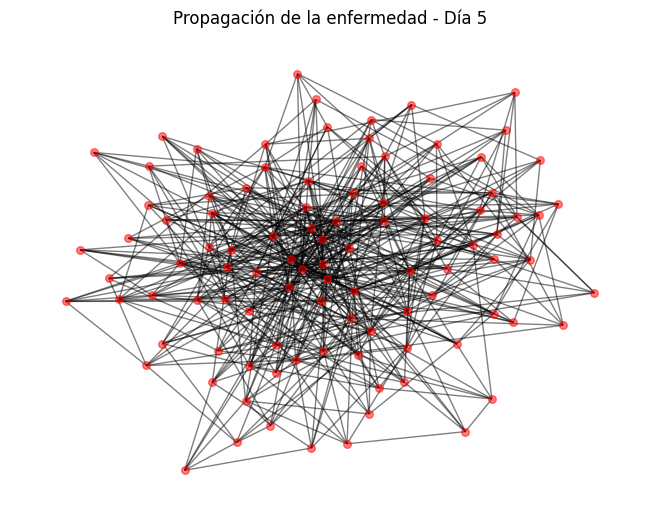

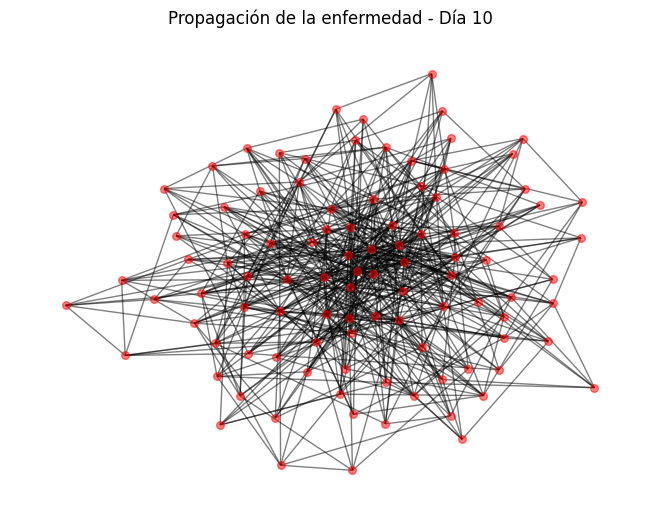

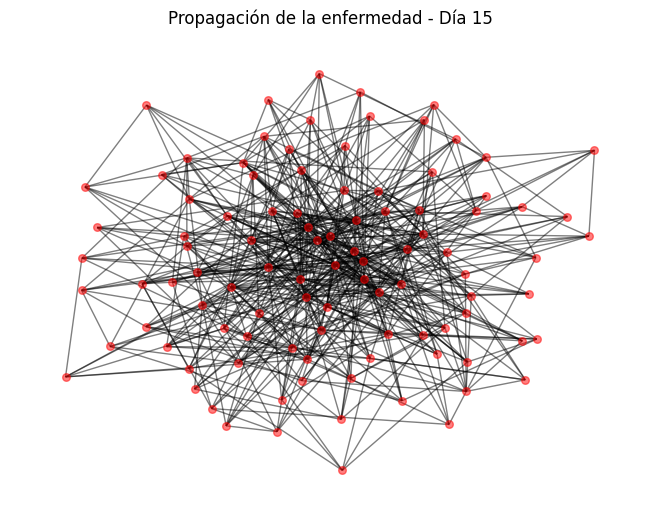

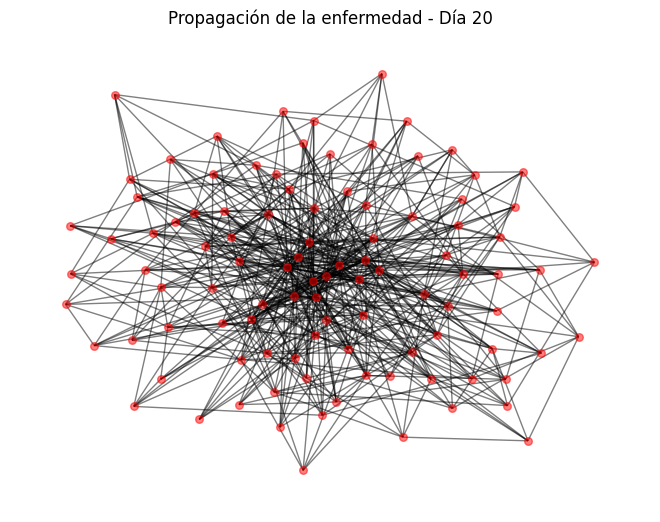

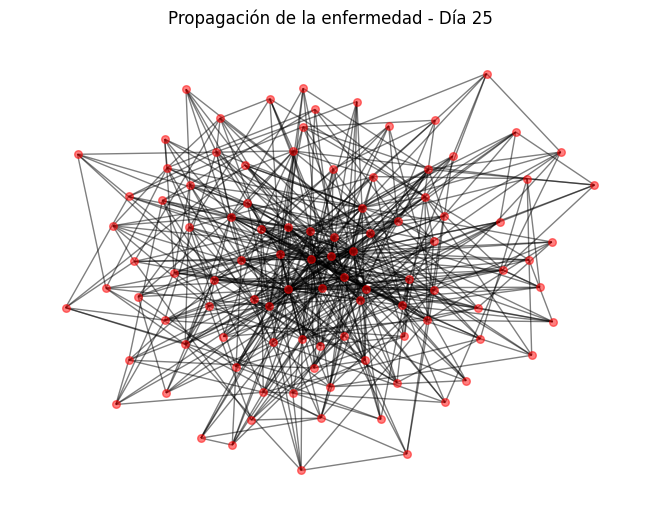

In [ ]:
import networkx as nx

# Creates a model of the spread of disease
model_ba = ModelSIRD(num_nodes=100, avg_connections=6, transmission_rate=0.08, incubation_period=2, infection_duration=7, supercontagion_prob=0.4)

# Perform a simulation
graph = model_ba.simulate(max_time=30)
